Mohammed Faraz Ali

In [1]:
%pylab inline

import os
import cv2
import numpy as np
import re
import pylab as pl
from fnmatch import fnmatch
from IPython.core.display import Image

# Location of AdaBoost Haar Cascade
OPENCV_PATH = "/usr/local/share/OpenCV"
HAAR_CASCADE_PATH = OPENCV_PATH + "/haarcascades"
faceXML = os.path.join(OPENCV_PATH, HAAR_CASCADE_PATH, 'haarcascade_frontalface_default.xml')

print (faceXML)
faceCascade = cv2.CascadeClassifier(faceXML)  #Let's load the required XML classifiers.


Populating the interactive namespace from numpy and matplotlib
/usr/local/share/OpenCV/haarcascades/haarcascade_frontalface_default.xml


I am creating a list of dictionaries

In [2]:
def process_images_from_directory(faceCascade, directory): 
    imageDict = dict()
    for dirpath, dirnames, filenames in os.walk(directory):
        for filename in filenames:
            imageFile = (os.path.join(dirpath, filename))
            img = cv2.imread(imageFile)
            imgray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            faces = faceCascade.detectMultiScale(imgray, 1.1, 5) 
            imageDict[filename] = (img,imgray, faces)# Coordinate the image name as the key in the diction to the image array
            
    return imageDict

imgDict=dict()
listofDicts=[imgDict,imgDict,imgDict,imgDict,imgDict]  # creating a list of dictionaries
imageList=['A','B','C'] #Facedata sub directories, Only taking A,B,and C for now as it is getting out of memory when taking D and E too.

for i in range(len(imageList)):
    path="/home/CV/FaceData/"
    extension=imageList[i]
    directory=os.path.join(path,extension)
    listofDicts[i] = process_images_from_directory(faceCascade,directory)

i=0
for j in range(len(imageList)):
    for imageKey in listofDicts[j]:
        img,imgray, faces= listofDicts[j][imageKey]  #extracting gray image and face coordinates from each imagekey(filename)
        i=i+1
        print(i)
        print (imageKey, len(faces))
    

1
img_817.jpg 1
2
img_922.jpg 1
3
img_470.jpg 1
4
img_491.jpg 1
5
img_284.jpg 1
6
img_306.jpg 1
7
img_387.jpg 1
8
img_1149.jpg 1
9
img_726.jpg 0
10
img_433.jpg 2
11
img_185.jpg 1
12
img_351.jpg 1
13
img_779.jpg 1
14
img_654.jpg 1
15
img_627.jpg 1
16
img_481.jpg 1
17
img_431.jpg 1
18
img_633.jpg 1
19
img_490.jpg 1
20
img_560.jpg 2
21
img_567.jpg 1
22
img_680.jpg 1
23
img_1122.jpg 1
24
img_183.jpg 1
25
img_822.jpg 1
26
img_594.jpg 1
27
img_570.jpg 3
28
img_219.jpg 1
29
img_884.jpg 0
30
img_459.jpg 1
31
img_1087.jpg 1
32
img_535.jpg 1
33
img_552.jpg 1
34
img_347.jpg 1
35
img_290.jpg 1
36
img_846.jpg 1
37
img_840.jpg 1
38
img_690.jpg 1
39
img_209.jpg 2
40
img_601.jpg 1
41
img_368.jpg 1
42
img_791.jpg 2
43
img_935.jpg 1
44
img_527.jpg 2
45
img_432.jpg 1
46
img_782.jpg 1
47
img_717.jpg 1
48
img_818.jpg 1
49
img_358.jpg 1
50
img_1088.jpg 1
51
img_417.jpg 0
52
img_294.jpg 1
53
img_814.jpg 1
54
img_390.jpg 2
55
img_584.jpg 1
56
img_972.jpg 1
57
img_568.jpg 2
58
img_200.jpg 1
59
img_664.jpg 2
60

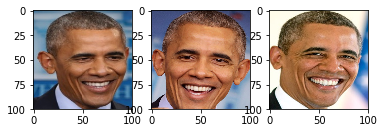

In [3]:
template=cv2.imread('/home/CV/FaceData/ObamaTemplate/ObamaTemplate0.jpg')
template=cv2.cvtColor(template, cv2.COLOR_BGR2RGB)
template=cv2.resize(template,(100,100))

template2=cv2.imread('/home/CV/FaceData/ObamaTemplate/ObamaTemplate1.jpg')
template2=cv2.cvtColor(template2, cv2.COLOR_BGR2RGB)
template2=cv2.resize(template2,(100,100))

template3=cv2.imread('/home/CV/FaceData/ObamaTemplate/ObamaTemplate2.jpg')
template3=cv2.cvtColor(template3, cv2.COLOR_BGR2RGB)
template3=cv2.resize(template3,(100,100))
plt.subplot(1,3,1)
plt.imshow(template)
plt.subplot(1,3,2)
plt.imshow(template2)
plt.subplot(1,3,3)
plt.imshow(template3)

In [4]:

for j in range(len(imageList)):
    for imageKey in listofDicts[j]:
        for (x,y,w,h) in listofDicts[j][imageKey][2]:        #imgDict[imageKey][2] is faces coordinates
            cv2.rectangle(listofDicts[j][imageKey][0],(x,y),(x+w,y+h),(255,0,0),2) #plotting on Color images
            roi_Color = listofDicts[j][imageKey][0][y:y+h, x:x+w]   #only face square from y to y+h
            scores = cv2.matchTemplate(roi_Color,template,method=cv2.TM_CCORR_NORMED) 
            scores2 = cv2.matchTemplate(roi_Color,template2,method=cv2.TM_CCORR_NORMED)
            scores3 = cv2.matchTemplate(roi_Color,template3,method=cv2.TM_CCORR_NORMED)
            if (scores.max()>0.90 and scores2.max()>0.905 and scores3.max()>0.905):
                print("This photo has obama  ",imageKey)
            else:
                print("This photo does not have obama  ",imageKey)   

This photo does not have obama   img_817.jpg
This photo does not have obama   img_922.jpg
This photo does not have obama   img_470.jpg
This photo does not have obama   img_491.jpg
This photo does not have obama   img_284.jpg
This photo does not have obama   img_306.jpg
This photo does not have obama   img_387.jpg
This photo does not have obama   img_1149.jpg
This photo does not have obama   img_433.jpg
This photo does not have obama   img_433.jpg
This photo does not have obama   img_185.jpg
This photo does not have obama   img_351.jpg
This photo does not have obama   img_779.jpg
This photo does not have obama   img_654.jpg
This photo does not have obama   img_627.jpg
This photo does not have obama   img_481.jpg
This photo does not have obama   img_431.jpg
This photo does not have obama   img_633.jpg
This photo does not have obama   img_490.jpg
This photo does not have obama   img_560.jpg
This photo does not have obama   img_560.jpg
This photo does not have obama   img_567.jpg
This phot

This photo does not have obama   img_504.jpg
This photo does not have obama   img_935.jpg
This photo does not have obama   img_99.jpg
This photo has obama   img_1004.jpg
This photo does not have obama   img_206.jpg
This photo does not have obama   img_721.jpg
This photo does not have obama   img_522.jpg
This photo does not have obama   img_848.jpg
This photo does not have obama   img_258.jpg
This photo does not have obama   img_1218.jpg
This photo has obama   img_1135.jpg
This photo does not have obama   img_1135.jpg
This photo does not have obama   img_377.jpg
This photo does not have obama   img_377.jpg
This photo does not have obama   img_360.jpg
This photo does not have obama   img_1347.jpg
This photo does not have obama   img_1102.jpg
This photo does not have obama   img_1102.jpg
This photo does not have obama   img_1476.jpg
This photo does not have obama   img_288.jpg
This photo does not have obama   img_270.jpg
This photo does not have obama   img_270.jpg
This photo does not hav

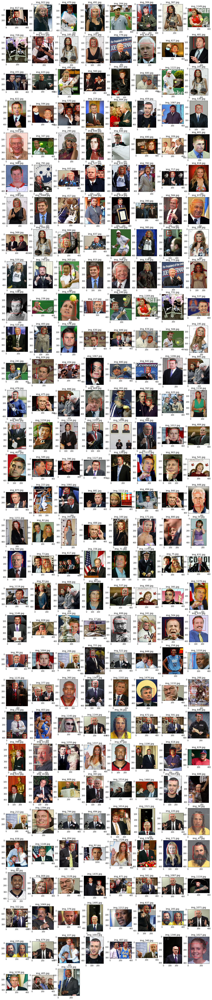

In [5]:
i=1
plt.figure(figsize=(20,100))
for j in range(len(imageList)):
    for imageKey in listofDicts[j]:
        plt.subplot(31,8,i)
        plt.imshow(listofDicts[j][imageKey][0])
        plt.title(imageKey)
        i=i+1


The Results are not that perfect but 95% accurate result.
Now Doing the Same for Directory D and E

In [6]:
imageList2=['D','E']
imgDict2=dict()
listofDicts2=[imgDict2,imgDict2]

for i in range(len(imageList2)):
    path="/home/CV/FaceData/"
    extension=imageList2[i]
    directory=os.path.join(path,extension)
    listofDicts2[i] = process_images_from_directory(faceCascade,directory)

i=0
for j in range(len(imageList2)):
    for imageKey in listofDicts2[j]:
        img,imgray, faces= listofDicts2[j][imageKey]  #extracting gray image and face coordinates from each imagekey(filename)
        i=i+1
        print(i)
        print (imageKey, len(faces))

1
img_9.jpg 1
2
img_847.jpg 1
3
img_710.jpg 2
4
img_775.jpg 1
5
img_626.jpg 1
6
img_842.jpg 1
7
img_673.jpg 0
8
img_667.jpg 1
9
img_999.jpg 2
10
img_570.jpg 1
11
img_896.jpg 1
12
img_844.jpg 1
13
img_662.jpg 1
14
img_600.jpg 2
15
img_846.jpg 1
16
img_850.jpg 1
17
img_686.jpg 0
18
img_93.jpg 3
19
img_53.jpg 2
20
img_845.jpg 1
21
img_867.jpg 2
22
img_655.jpg 1
23
img_681.jpg 1
24
img_534.jpg 2
25
img_711.jpg 2
26
img_939.jpg 1
27
img_549.jpg 0
28
img_851.jpg 1
29
img_734.jpg 1
30
img_886.jpg 1
31
img_562.jpg 1
32
img_1145.jpg 1
33
img_563.jpg 2
34
img_415.jpg 1
35
img_577.jpg 2
36
img_1243.jpg 1
37
img_429.jpg 1
38
img_341.jpg 3
39
img_514.jpg 1
40
img_454.jpg 3
41
img_468.jpg 1
42
img_1072.jpg 2
43
img_617.jpg 1
44
img_1279.jpg 1
45
img_654.jpg 1
46
img_1206.jpg 1
47
img_553.jpg 1
48
img_407.jpg 1
49
img_801.jpg 2
50
img_414.jpg 2
51
img_651.jpg 1
52
img_683.jpg 2
53
img_560.jpg 2
54
img_613.jpg 1
55
img_588.jpg 2
56
img_1060.jpg 1
57
img_268.jpg 1
58
img_555.jpg 1
59
img_1116.jpg 1
60


In [7]:
for j in range(len(imageList2)):
    for imageKey in listofDicts2[j]:
        for (x,y,w,h) in listofDicts2[j][imageKey][2]:        #imgDict[imageKey][2] is faces coordinates
            cv2.rectangle(listofDicts2[j][imageKey][0],(x,y),(x+w,y+h),(255,0,0),2) #plotting on Color images
            roi_Color = listofDicts2[j][imageKey][0][y:y+h, x:x+w]   #only face square from y to y+h
            scores = cv2.matchTemplate(roi_Color,template,method=cv2.TM_CCORR_NORMED) 
            scores2 = cv2.matchTemplate(roi_Color,template2,method=cv2.TM_CCORR_NORMED)
            scores3 = cv2.matchTemplate(roi_Color,template3,method=cv2.TM_CCORR_NORMED)
            if (scores.max()>0.90 and scores2.max()>0.905 and scores3.max()>0.905):
                print("This photo has obama  ",imageKey)
            else:
                print("This photo does not have obama  ",imageKey)   

This photo does not have obama   img_9.jpg
This photo does not have obama   img_847.jpg
This photo does not have obama   img_710.jpg
This photo does not have obama   img_710.jpg
This photo does not have obama   img_775.jpg
This photo does not have obama   img_626.jpg
This photo does not have obama   img_842.jpg
This photo has obama   img_667.jpg
This photo does not have obama   img_999.jpg
This photo has obama   img_999.jpg
This photo does not have obama   img_570.jpg
This photo does not have obama   img_896.jpg
This photo does not have obama   img_844.jpg
This photo does not have obama   img_662.jpg
This photo does not have obama   img_600.jpg
This photo does not have obama   img_600.jpg
This photo does not have obama   img_846.jpg
This photo does not have obama   img_850.jpg
This photo does not have obama   img_93.jpg
This photo does not have obama   img_93.jpg
This photo does not have obama   img_93.jpg
This photo has obama   img_53.jpg
This photo does not have obama   img_53.jpg
Th

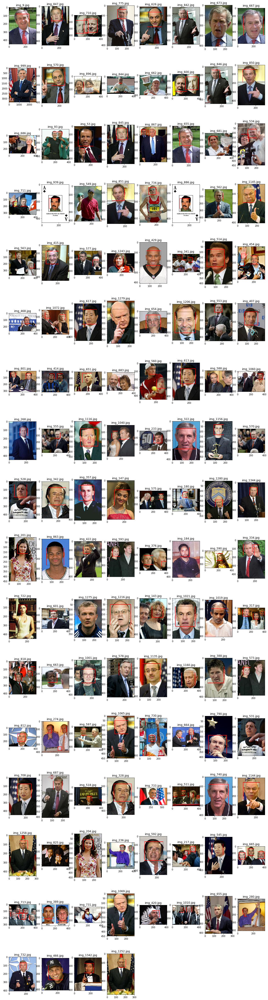

In [8]:
i=1
plt.figure(figsize=(20,80))
for j in range(len(imageList2)):
    for imageKey in listofDicts2[j]:
        plt.subplot(17,8,i)
        plt.imshow(listofDicts2[j][imageKey][0])
        plt.title(imageKey)
        i=i+1